# **Deep Convolution Adversarial Networks**

Generative adversarial networks (GANs) are algorithmic architectures that use two neural networks, pitting one against the other (thus the “adversarial”) in order to generate new, synthetic instances of data that can pass for real data. They are used widely in image generation, video generation and voice generation.

GANs are made up of two components -

1. **Generator - generates new data instances**

2. **Discriminator - tries to distinguish the generated or fake data from the real dataset.**

Discriminative algorithms try to classify input data; that is, given the features of an instance of data, they predict a label or category to which that data belongs. So discriminative algorithms map features to labels. They are concerned solely with that correlation.One the other way,loosely speaking,generative algorithms do the opposite. Instead of predicting a label given certain features, they attempt to predict features given a certain label.

While training they both start together from scratch and the generator learn to shape the random distribition through the training epochs.

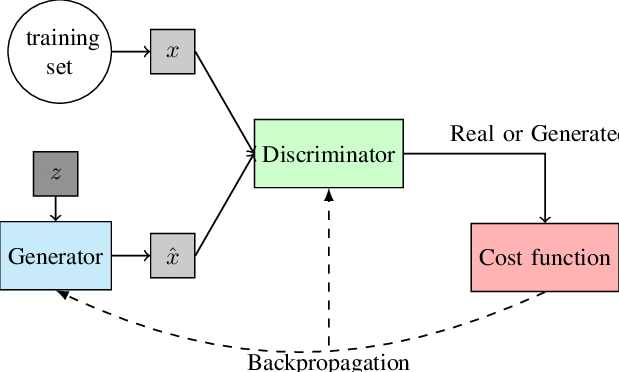

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory


general_path = r'C:\Users\weldl\Datasets\Album Covers Images'
import os
for dirname, _, filenames in os.walk(general_path):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

C:\Users\weldl\Datasets\Album Covers Images\0.jpg
C:\Users\weldl\Datasets\Album Covers Images\1.jpg
C:\Users\weldl\Datasets\Album Covers Images\10.jpg
C:\Users\weldl\Datasets\Album Covers Images\100.jpg
C:\Users\weldl\Datasets\Album Covers Images\1000.jpg
C:\Users\weldl\Datasets\Album Covers Images\10000.jpg
C:\Users\weldl\Datasets\Album Covers Images\10001.jpg
C:\Users\weldl\Datasets\Album Covers Images\10002.jpg
C:\Users\weldl\Datasets\Album Covers Images\10003.jpg
C:\Users\weldl\Datasets\Album Covers Images\10004.jpg
C:\Users\weldl\Datasets\Album Covers Images\10005.jpg
C:\Users\weldl\Datasets\Album Covers Images\10006.jpg
C:\Users\weldl\Datasets\Album Covers Images\10007.jpg
C:\Users\weldl\Datasets\Album Covers Images\10008.jpg
C:\Users\weldl\Datasets\Album Covers Images\10009.jpg
C:\Users\weldl\Datasets\Album Covers Images\1001.jpg
C:\Users\weldl\Datasets\Album Covers Images\10010.jpg
C:\Users\weldl\Datasets\Album Covers Images\10011.jpg
C:\Users\weldl\Datasets\Album Covers Images

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



C:\Users\weldl\Datasets\Album Covers Images\73529.jpg
C:\Users\weldl\Datasets\Album Covers Images\7353.jpg
C:\Users\weldl\Datasets\Album Covers Images\73530.jpg
C:\Users\weldl\Datasets\Album Covers Images\73531.jpg
C:\Users\weldl\Datasets\Album Covers Images\73532.jpg
C:\Users\weldl\Datasets\Album Covers Images\73533.jpg
C:\Users\weldl\Datasets\Album Covers Images\73534.jpg
C:\Users\weldl\Datasets\Album Covers Images\73535.jpg
C:\Users\weldl\Datasets\Album Covers Images\73536.jpg
C:\Users\weldl\Datasets\Album Covers Images\73537.jpg
C:\Users\weldl\Datasets\Album Covers Images\73538.jpg
C:\Users\weldl\Datasets\Album Covers Images\73539.jpg
C:\Users\weldl\Datasets\Album Covers Images\7354.jpg
C:\Users\weldl\Datasets\Album Covers Images\73540.jpg
C:\Users\weldl\Datasets\Album Covers Images\73541.jpg
C:\Users\weldl\Datasets\Album Covers Images\73542.jpg
C:\Users\weldl\Datasets\Album Covers Images\73543.jpg
C:\Users\weldl\Datasets\Album Covers Images\73544.jpg
C:\Users\weldl\Datasets\Album 

# **LOSS FUNCTION of simple GAN**

In the paper that introduced GANs(link below in the reference), the generator tries to minimize the following function while the discriminator tries to maximize it:

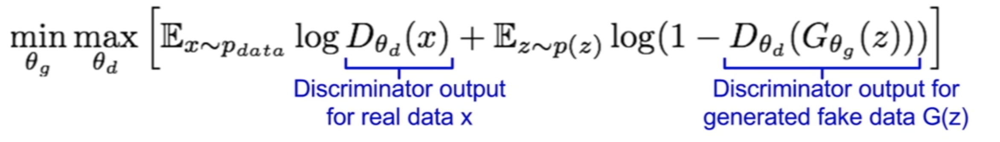

In this function:

D(x) is the discriminator's estimate of the probability that real data instance x is real.

Ex is the expected value over all real data instances.

G(z) is the generator's output when given noise z.

D(G(z)) is the discriminator's estimate of the probability that a fake instance is real.

Ez is the expected value over all random inputs to the generator (in effect, the expected value over all generated fake instances G(z)).

The generator can't directly affect the log(D(x)) term in the function, so, for the generator, minimizing the loss is equivalent to minimizing log(1 - D(G(z))).

# **Loadind and Preprocessing data**

In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import os
from tensorflow.keras import preprocessing
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D,UpSampling2D,Dropout,Dense,Flatten,Conv2DTranspose,BatchNormalization,LeakyReLU,Reshape,ZeroPadding2D,Input,Activation
import tensorflow as tf


In [3]:
import os
cwd = os.getcwd()
os.chdir(cwd)
# print(os.listdir("../input"))

In [4]:
path_celeb = []
train_path_celeb = general_path
for path in os.listdir(train_path_celeb):
    if '.jpg' in path:
        path_celeb.append(os.path.join(train_path_celeb, path))

In [5]:
new_path=path_celeb[0:5000]


the dataset have more than 202k images of which only 50k are being selected for the training purpose

In [6]:
len(new_path)

5000

In [7]:
# crop = (30, 55, 150, 175) #croping size for the image so that only the face at centre is obtained
# images = [np.array((Image.open(path).crop(crop)).resize((64,64))) for path in new_path]
images = [np.array(Image.open(path).resize((64, 64))) for path in new_path]

for i in range(len(images)):
    images[i] = images[i]/255
#     images[i] = ((images[i] - images[i].min())/(255 - images[i].min()))
#     images[i] = (images[i]*2)   #uncomment this if activation is tanh for generator last layer
    
images = np.array(images) 
print(images.min(), images.max())

0.0 1.0


In [8]:
train_data=images

In [9]:
# print(path_celeb)

In [10]:
len(path_celeb)

79734

In [11]:
print(train_data.shape)

(5000, 64, 64, 3)


In [12]:
IMG_SHAPE = train_data.shape[1:]

# **Data Visualization**

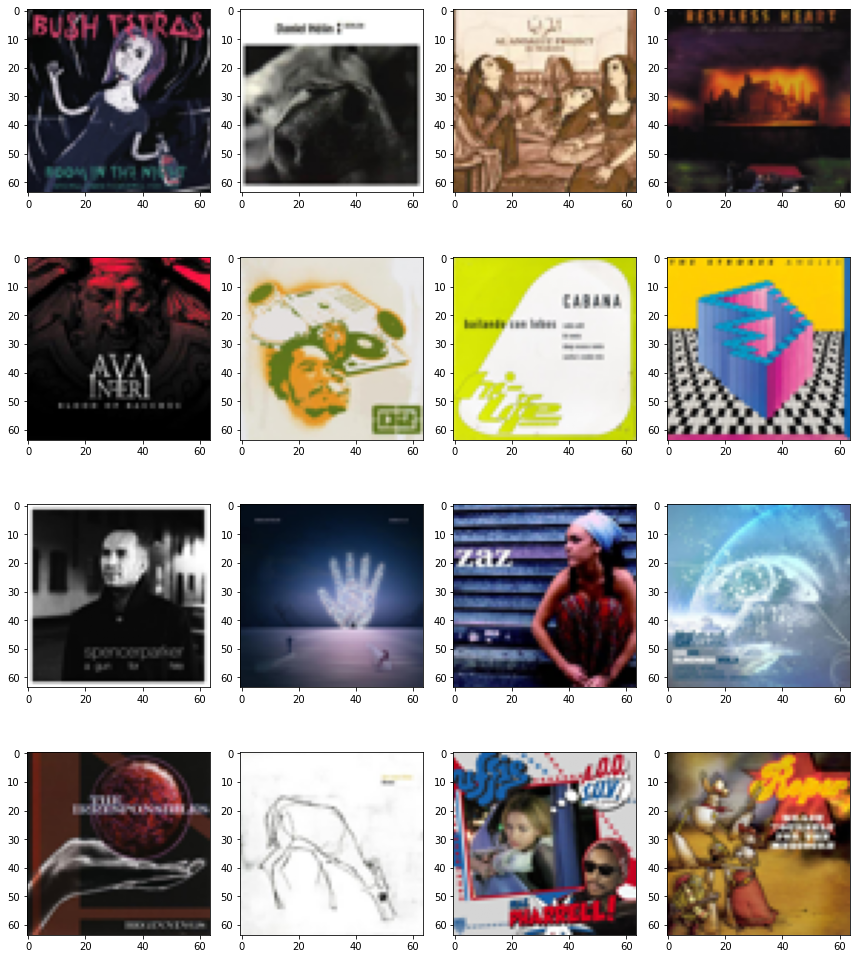

In [13]:
def plot_img_samples(img_array, figsize=(12, 14), title=None):
    plt.figure(figsize=figsize)
    plt.title(title)
    idx=0
    for i in range(4):
        for j in range(4):
                plt.subplot(4,4, i*4 + j +1)
                plt.imshow(img_array[idx])
                idx+=1
    plt.tight_layout()
    plt.show()

plot_img_samples(train_data)

**Note**  -- the image pixels are normalized dividing each pixel by 255 and then modified to bring within (-1,1) range by multiplying with 2 and substracting 1 since the last layer activation of generator is tanh whose range limits (-1,1)

In [14]:
X_train = train_data

# **Architecture of the Model**

The core to the DCGAN architecture uses a standard CNN architecture on the discriminative model. For the generator, convolutions are replaced with upconvolutions, so the representation at each layer of the generator is actually successively larger, as it mapes from a low-dimensional latent vector onto a high-dimensional image.



Use batch normalization in both the generator and the discriminator.

Remove fully connected hidden layers for deeper architectures.

Use ReLU activation in generator for all layers except for the output, which uses Tanh.

Use LeakyReLU activation in the discriminator for all layers.

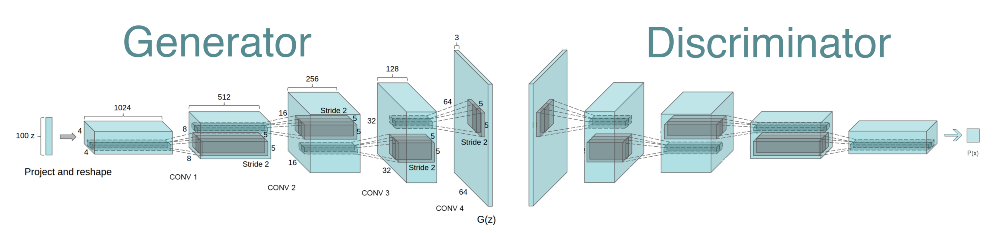

# **Generator**

In [15]:
noise_shape = 100

In [16]:
def build_generator(noise_size, channels):
    GENERATE_RES=2
    model = Sequential()
    model.add(Dense(4 * 4 * 256, activation="relu",       input_dim=noise_size))
    model.add(Reshape((4, 4, 256)))
    model.add(UpSampling2D())
    model.add(Conv2D(256, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    model.add(UpSampling2D())
    model.add(Conv2D(256, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
    for i in range(GENERATE_RES):
         model.add(UpSampling2D())
         model.add(Conv2D(256, kernel_size=3, padding="same"))
         model.add(BatchNormalization(momentum=0.8))
         model.add(Activation("relu"))
#     model.summary()
    model.add(Conv2D(channels, kernel_size=3, padding="same"))
    model.add(Activation('sigmoid'))
#     input = Input(shape=(noise_size,))
#     generated_image = model(input)
    
    return model

generator = build_generator(noise_shape, channels=IMG_SHAPE[-1])

the last layer for generator  have sigmoid activation in this version since I was trying between sigmoid and tanh to see which outputs better results. I found sigmoid activated model having better clarity in this case, however I have tried tanh activated generator too so if anyone want to refer to that can look at version 6/7 of this kernel where I use tanh. In case of using tanh the input pixels should be normalised between (-1,1) unlike sigmoid where it has been normalised between (0,1) .


In [17]:
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 4096)              413696    
_________________________________________________________________
reshape (Reshape)            (None, 4, 4, 256)         0         
_________________________________________________________________
up_sampling2d (UpSampling2D) (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 8, 8, 256)         590080    
_________________________________________________________________
batch_normalization (BatchNo (None, 8, 8, 256)         1024      
_________________________________________________________________
activation (Activation)      (None, 8, 8, 256)         0         
_________________________________________________________________
up_sampling2d_1 (UpSampling2 (None, 16, 16, 256)       0

# **Discriminator**

In [18]:
discriminator = Sequential()
discriminator.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.4))
discriminator.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.4))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation='sigmoid'))

In [19]:
# def build_discriminator(image_shape):
#     model = Sequential()
#     model.add(Conv2D(32, kernel_size=3, strides=2,
#     input_shape=image_shape, padding="same"))
#     model.add(LeakyReLU(alpha=0.2))
#     model.add(Dropout(0.25))
#     model.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
#     model.add(ZeroPadding2D(padding=((0, 1), (0, 1))))
#     model.add(BatchNormalization(momentum=0.8))
#     model.add(LeakyReLU(alpha=0.2))
#     model.add(Dropout(0.25))
#     model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
#     model.add(BatchNormalization(momentum=0.8))
#     model.add(LeakyReLU(alpha=0.2))
#     model.add(Dropout(0.25))
#     model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
#     model.add(BatchNormalization(momentum=0.8))
#     model.add(LeakyReLU(alpha=0.2))
#     model.add(Dropout(0.25))
#     model.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
#     model.add(BatchNormalization(momentum=0.8))
#     model.add(LeakyReLU(alpha=0.2))
#     model.add(Dropout(0.25))
#     model.add(Flatten())
#     model.add(Dense(1, activation='sigmoid'))
#     input_image = Input(shape=image_shape)
#     validity = model(input_image)
#     return Model(input_image, validity)

# discriminator = build_discriminator(IMG_SHAPE)

In [20]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 16, 16, 64)        36928     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 16384)            

# **DCGAN (combined model)**

In [21]:
GAN =Sequential([generator,discriminator])

In [22]:
discriminator.compile(optimizer='adam',loss='binary_crossentropy')
discriminator.trainable = False

In [23]:
GAN.compile(optimizer='adam',loss='binary_crossentropy')

In [24]:
GAN.layers

In [25]:
GAN.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 64, 64, 3)         2785027   
_________________________________________________________________
sequential_1 (Sequential)    (None, 1)                 55105     
Total params: 2,840,132
Trainable params: 2,782,979
Non-trainable params: 57,153
_________________________________________________________________


# **Training**

In [26]:
epochs = 100  #set epoch according to your training dataset size,i had chosen 50k images hence epochs are high as 300...
batch_size = 64

In [27]:
D_loss=[] #list to collect loss for the discriminator model
G_loss=[] #list to collect loss for generator model

Currently on Epoch 1
	Currently on batch number 0 of 78


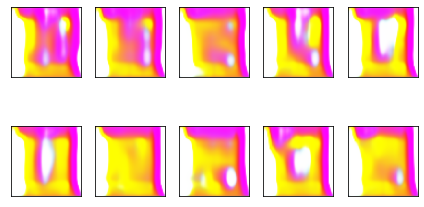

Epoch: 1,  Loss: D_real = 1.253, D_fake = 0.125,  G = 2.365
Currently on Epoch 2
	Currently on batch number 0 of 78
Epoch: 2,  Loss: D_real = 0.138, D_fake = 0.008,  G = 4.763
Currently on Epoch 3
	Currently on batch number 0 of 78
Epoch: 3,  Loss: D_real = 0.466, D_fake = 0.249,  G = 1.806
Currently on Epoch 4
	Currently on batch number 0 of 78
Epoch: 4,  Loss: D_real = 0.399, D_fake = 0.012,  G = 8.608
Currently on Epoch 5
	Currently on batch number 0 of 78
Epoch: 5,  Loss: D_real = 0.200, D_fake = 0.139,  G = 3.456
Currently on Epoch 6
	Currently on batch number 0 of 78


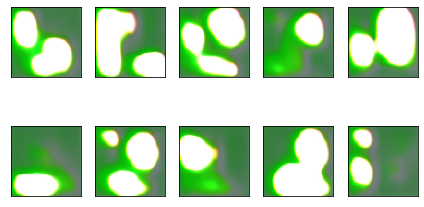

Epoch: 6,  Loss: D_real = 0.163, D_fake = 0.119,  G = 2.203
Currently on Epoch 7
	Currently on batch number 0 of 78
Epoch: 7,  Loss: D_real = 0.867, D_fake = 1.224,  G = 1.121
Currently on Epoch 8
	Currently on batch number 0 of 78
Epoch: 8,  Loss: D_real = 0.347, D_fake = 0.162,  G = 7.677
Currently on Epoch 9
	Currently on batch number 0 of 78
Epoch: 9,  Loss: D_real = 0.909, D_fake = 0.095,  G = 3.295
Currently on Epoch 10
	Currently on batch number 0 of 78
Epoch: 10,  Loss: D_real = 0.682, D_fake = 0.110,  G = 2.155
Currently on Epoch 11
	Currently on batch number 0 of 78


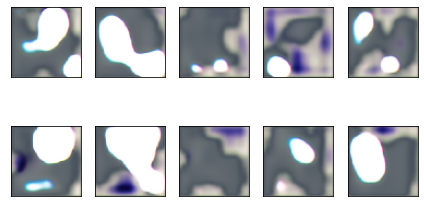

Epoch: 11,  Loss: D_real = 1.063, D_fake = 0.481,  G = 1.201
Currently on Epoch 12
	Currently on batch number 0 of 78
Epoch: 12,  Loss: D_real = 0.282, D_fake = 0.142,  G = 1.717
Currently on Epoch 13
	Currently on batch number 0 of 78
Epoch: 13,  Loss: D_real = 0.360, D_fake = 0.113,  G = 3.980
Currently on Epoch 14
	Currently on batch number 0 of 78
Epoch: 14,  Loss: D_real = 1.046, D_fake = 0.502,  G = 1.468
Currently on Epoch 15
	Currently on batch number 0 of 78
Epoch: 15,  Loss: D_real = 0.643, D_fake = 0.359,  G = 1.784
Currently on Epoch 16
	Currently on batch number 0 of 78


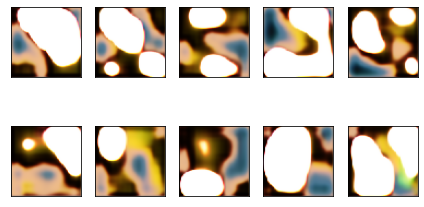

Epoch: 16,  Loss: D_real = 0.748, D_fake = 0.719,  G = 1.934
Currently on Epoch 17
	Currently on batch number 0 of 78
Epoch: 17,  Loss: D_real = 0.666, D_fake = 0.333,  G = 1.688
Currently on Epoch 18
	Currently on batch number 0 of 78
Epoch: 18,  Loss: D_real = 0.700, D_fake = 0.220,  G = 1.803
Currently on Epoch 19
	Currently on batch number 0 of 78
Epoch: 19,  Loss: D_real = 0.938, D_fake = 0.205,  G = 2.001
Currently on Epoch 20
	Currently on batch number 0 of 78
Epoch: 20,  Loss: D_real = 0.583, D_fake = 0.425,  G = 1.673
Currently on Epoch 21
	Currently on batch number 0 of 78


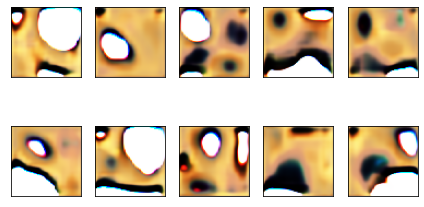

Epoch: 21,  Loss: D_real = 1.239, D_fake = 0.633,  G = 1.172
Currently on Epoch 22
	Currently on batch number 0 of 78
Epoch: 22,  Loss: D_real = 0.227, D_fake = 0.152,  G = 3.688
Currently on Epoch 23
	Currently on batch number 0 of 78
Epoch: 23,  Loss: D_real = 0.342, D_fake = 0.223,  G = 2.179
Currently on Epoch 24
	Currently on batch number 0 of 78
Epoch: 24,  Loss: D_real = 0.694, D_fake = 0.436,  G = 2.219
Currently on Epoch 25
	Currently on batch number 0 of 78
Epoch: 25,  Loss: D_real = 0.235, D_fake = 0.402,  G = 1.575
Currently on Epoch 26
	Currently on batch number 0 of 78


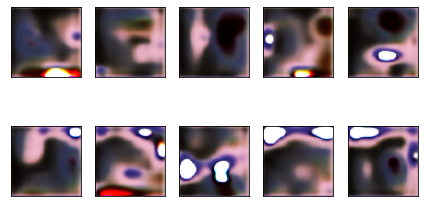

Epoch: 26,  Loss: D_real = 0.351, D_fake = 0.233,  G = 2.298
Currently on Epoch 27
	Currently on batch number 0 of 78
Epoch: 27,  Loss: D_real = 0.292, D_fake = 0.203,  G = 2.443
Currently on Epoch 28
	Currently on batch number 0 of 78
Epoch: 28,  Loss: D_real = 0.432, D_fake = 0.348,  G = 1.616
Currently on Epoch 29
	Currently on batch number 0 of 78
Epoch: 29,  Loss: D_real = 0.380, D_fake = 0.174,  G = 1.714
Currently on Epoch 30
	Currently on batch number 0 of 78
Epoch: 30,  Loss: D_real = 0.731, D_fake = 0.492,  G = 1.808
Currently on Epoch 31
	Currently on batch number 0 of 78


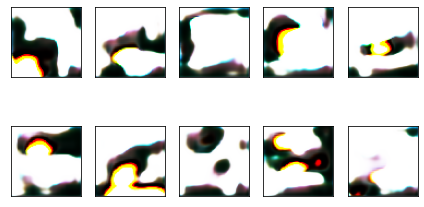

Epoch: 31,  Loss: D_real = 0.916, D_fake = 1.105,  G = 1.611
Currently on Epoch 32
	Currently on batch number 0 of 78
Epoch: 32,  Loss: D_real = 0.817, D_fake = 0.292,  G = 1.496
Currently on Epoch 33
	Currently on batch number 0 of 78
Epoch: 33,  Loss: D_real = 0.652, D_fake = 0.620,  G = 0.961
Currently on Epoch 34
	Currently on batch number 0 of 78
Epoch: 34,  Loss: D_real = 1.044, D_fake = 0.223,  G = 1.518
Currently on Epoch 35
	Currently on batch number 0 of 78
Epoch: 35,  Loss: D_real = 0.238, D_fake = 0.161,  G = 2.621
Currently on Epoch 36
	Currently on batch number 0 of 78


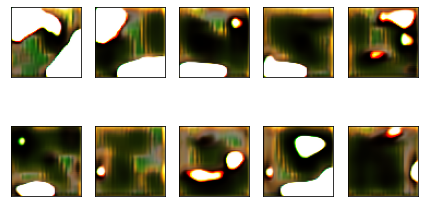

Epoch: 36,  Loss: D_real = 0.334, D_fake = 0.313,  G = 2.300
Currently on Epoch 37
	Currently on batch number 0 of 78
Epoch: 37,  Loss: D_real = 0.215, D_fake = 0.176,  G = 2.480
Currently on Epoch 38
	Currently on batch number 0 of 78
Epoch: 38,  Loss: D_real = 0.600, D_fake = 0.722,  G = 1.646
Currently on Epoch 39
	Currently on batch number 0 of 78
Epoch: 39,  Loss: D_real = 1.171, D_fake = 0.450,  G = 1.045
Currently on Epoch 40
	Currently on batch number 0 of 78
Epoch: 40,  Loss: D_real = 0.255, D_fake = 0.079,  G = 3.397
Currently on Epoch 41
	Currently on batch number 0 of 78


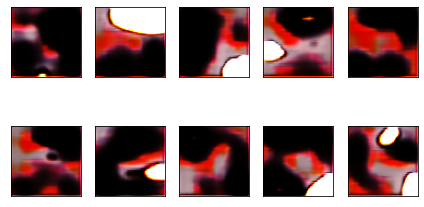

Epoch: 41,  Loss: D_real = 0.874, D_fake = 0.279,  G = 1.856
Currently on Epoch 42
	Currently on batch number 0 of 78
Epoch: 42,  Loss: D_real = 0.817, D_fake = 0.150,  G = 2.044
Currently on Epoch 43
	Currently on batch number 0 of 78
Epoch: 43,  Loss: D_real = 0.687, D_fake = 0.223,  G = 1.728
Currently on Epoch 44
	Currently on batch number 0 of 78
Epoch: 44,  Loss: D_real = 0.483, D_fake = 0.227,  G = 1.805
Currently on Epoch 45
	Currently on batch number 0 of 78
Epoch: 45,  Loss: D_real = 0.342, D_fake = 0.149,  G = 2.587
Currently on Epoch 46
	Currently on batch number 0 of 78


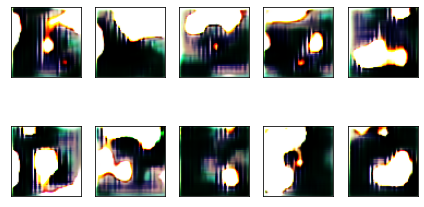

Epoch: 46,  Loss: D_real = 0.210, D_fake = 0.297,  G = 2.008
Currently on Epoch 47
	Currently on batch number 0 of 78
Epoch: 47,  Loss: D_real = 0.184, D_fake = 0.066,  G = 4.147
Currently on Epoch 48
	Currently on batch number 0 of 78
Epoch: 48,  Loss: D_real = 0.883, D_fake = 0.331,  G = 1.992
Currently on Epoch 49
	Currently on batch number 0 of 78
Epoch: 49,  Loss: D_real = 0.501, D_fake = 0.162,  G = 2.489
Currently on Epoch 50
	Currently on batch number 0 of 78
Epoch: 50,  Loss: D_real = 0.364, D_fake = 0.295,  G = 1.350
Currently on Epoch 51
	Currently on batch number 0 of 78


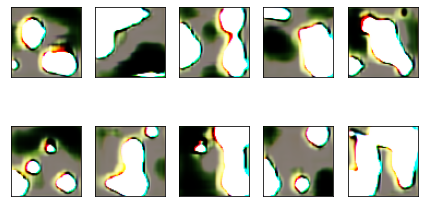

Epoch: 51,  Loss: D_real = 0.251, D_fake = 0.172,  G = 2.617
Currently on Epoch 52
	Currently on batch number 0 of 78
Epoch: 52,  Loss: D_real = 0.403, D_fake = 0.232,  G = 2.523
Currently on Epoch 53
	Currently on batch number 0 of 78
Epoch: 53,  Loss: D_real = 0.721, D_fake = 0.534,  G = 1.752
Currently on Epoch 54
	Currently on batch number 0 of 78
Epoch: 54,  Loss: D_real = 0.391, D_fake = 0.046,  G = 3.611
Currently on Epoch 55
	Currently on batch number 0 of 78
Epoch: 55,  Loss: D_real = 0.424, D_fake = 0.145,  G = 4.368
Currently on Epoch 56
	Currently on batch number 0 of 78


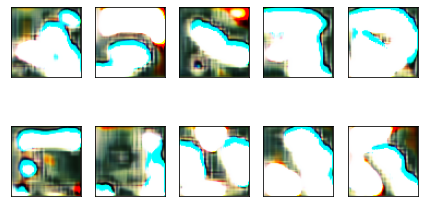

Epoch: 56,  Loss: D_real = 1.017, D_fake = 0.341,  G = 1.508
Currently on Epoch 57
	Currently on batch number 0 of 78
Epoch: 57,  Loss: D_real = 0.937, D_fake = 0.125,  G = 2.887
Currently on Epoch 58
	Currently on batch number 0 of 78
Epoch: 58,  Loss: D_real = 0.719, D_fake = 0.302,  G = 1.591
Currently on Epoch 59
	Currently on batch number 0 of 78
Epoch: 59,  Loss: D_real = 0.718, D_fake = 0.446,  G = 1.588
Currently on Epoch 60
	Currently on batch number 0 of 78
Epoch: 60,  Loss: D_real = 0.300, D_fake = 0.368,  G = 1.720
Currently on Epoch 61
	Currently on batch number 0 of 78


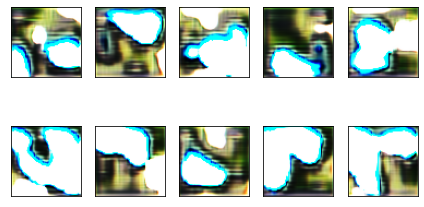

Epoch: 61,  Loss: D_real = 0.591, D_fake = 0.674,  G = 1.956
Currently on Epoch 62
	Currently on batch number 0 of 78
Epoch: 62,  Loss: D_real = 0.312, D_fake = 0.198,  G = 2.696
Currently on Epoch 63
	Currently on batch number 0 of 78
Epoch: 63,  Loss: D_real = 0.785, D_fake = 0.494,  G = 1.540
Currently on Epoch 64
	Currently on batch number 0 of 78
Epoch: 64,  Loss: D_real = 0.394, D_fake = 0.436,  G = 2.082
Currently on Epoch 65
	Currently on batch number 0 of 78
Epoch: 65,  Loss: D_real = 0.581, D_fake = 0.401,  G = 1.682
Currently on Epoch 66
	Currently on batch number 0 of 78


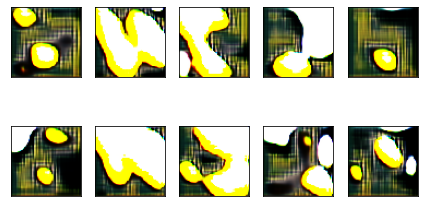

Epoch: 66,  Loss: D_real = 0.782, D_fake = 0.574,  G = 0.756
Currently on Epoch 67
	Currently on batch number 0 of 78
Epoch: 67,  Loss: D_real = 0.475, D_fake = 0.429,  G = 2.216
Currently on Epoch 68
	Currently on batch number 0 of 78
Epoch: 68,  Loss: D_real = 0.355, D_fake = 0.159,  G = 2.761
Currently on Epoch 69
	Currently on batch number 0 of 78
Epoch: 69,  Loss: D_real = 0.608, D_fake = 0.458,  G = 2.605
Currently on Epoch 70
	Currently on batch number 0 of 78
Epoch: 70,  Loss: D_real = 0.336, D_fake = 0.096,  G = 3.217
Currently on Epoch 71
	Currently on batch number 0 of 78


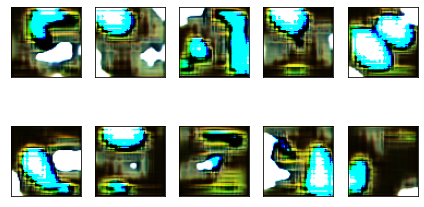

Epoch: 71,  Loss: D_real = 0.286, D_fake = 0.365,  G = 1.597
Currently on Epoch 72
	Currently on batch number 0 of 78
Epoch: 72,  Loss: D_real = 0.530, D_fake = 0.385,  G = 1.457
Currently on Epoch 73
	Currently on batch number 0 of 78
Epoch: 73,  Loss: D_real = 0.222, D_fake = 0.100,  G = 2.446
Currently on Epoch 74
	Currently on batch number 0 of 78
Epoch: 74,  Loss: D_real = 0.763, D_fake = 0.561,  G = 1.890
Currently on Epoch 75
	Currently on batch number 0 of 78
Epoch: 75,  Loss: D_real = 0.333, D_fake = 0.244,  G = 2.721
Currently on Epoch 76
	Currently on batch number 0 of 78


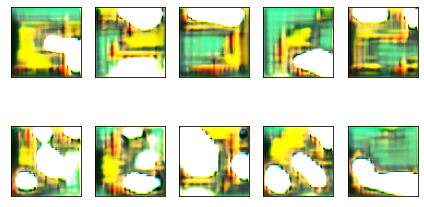

Epoch: 76,  Loss: D_real = 0.338, D_fake = 0.173,  G = 2.185
Currently on Epoch 77
	Currently on batch number 0 of 78
Epoch: 77,  Loss: D_real = 0.518, D_fake = 0.486,  G = 1.934
Currently on Epoch 78
	Currently on batch number 0 of 78
Epoch: 78,  Loss: D_real = 1.021, D_fake = 0.847,  G = 0.791
Currently on Epoch 79
	Currently on batch number 0 of 78
Epoch: 79,  Loss: D_real = 0.201, D_fake = 0.624,  G = 1.762
Currently on Epoch 80
	Currently on batch number 0 of 78
Epoch: 80,  Loss: D_real = 0.518, D_fake = 0.463,  G = 1.981
Currently on Epoch 81
	Currently on batch number 0 of 78


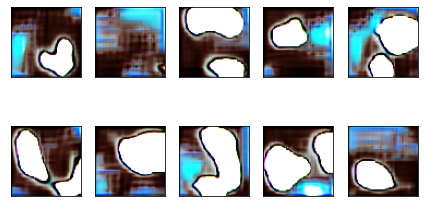

Epoch: 81,  Loss: D_real = 0.505, D_fake = 0.486,  G = 1.516
Currently on Epoch 82
	Currently on batch number 0 of 78
Epoch: 82,  Loss: D_real = 0.257, D_fake = 0.210,  G = 2.791
Currently on Epoch 83
	Currently on batch number 0 of 78
Epoch: 83,  Loss: D_real = 0.663, D_fake = 0.344,  G = 1.509
Currently on Epoch 84
	Currently on batch number 0 of 78
Epoch: 84,  Loss: D_real = 0.425, D_fake = 0.286,  G = 1.757
Currently on Epoch 85
	Currently on batch number 0 of 78
Epoch: 85,  Loss: D_real = 0.519, D_fake = 0.271,  G = 1.912
Currently on Epoch 86
	Currently on batch number 0 of 78


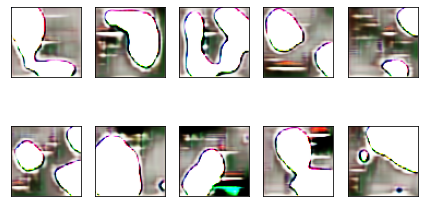

Epoch: 86,  Loss: D_real = 0.441, D_fake = 0.371,  G = 1.407
Currently on Epoch 87
	Currently on batch number 0 of 78
Epoch: 87,  Loss: D_real = 0.552, D_fake = 0.383,  G = 1.222
Currently on Epoch 88
	Currently on batch number 0 of 78
Epoch: 88,  Loss: D_real = 1.346, D_fake = 0.544,  G = 1.384
Currently on Epoch 89
	Currently on batch number 0 of 78
Epoch: 89,  Loss: D_real = 0.804, D_fake = 0.411,  G = 1.469
Currently on Epoch 90
	Currently on batch number 0 of 78
Epoch: 90,  Loss: D_real = 0.663, D_fake = 0.487,  G = 1.778
Currently on Epoch 91
	Currently on batch number 0 of 78


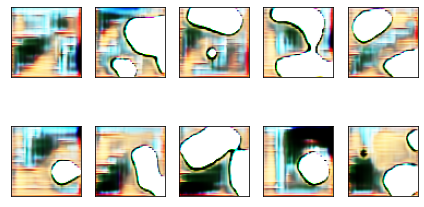

Epoch: 91,  Loss: D_real = 0.902, D_fake = 0.240,  G = 2.711
Currently on Epoch 92
	Currently on batch number 0 of 78
Epoch: 92,  Loss: D_real = 0.517, D_fake = 0.166,  G = 2.248
Currently on Epoch 93
	Currently on batch number 0 of 78
Epoch: 93,  Loss: D_real = 0.185, D_fake = 0.151,  G = 3.870
Currently on Epoch 94
	Currently on batch number 0 of 78
Epoch: 94,  Loss: D_real = 0.326, D_fake = 0.283,  G = 2.824
Currently on Epoch 95
	Currently on batch number 0 of 78
Epoch: 95,  Loss: D_real = 0.366, D_fake = 0.278,  G = 2.471
Currently on Epoch 96
	Currently on batch number 0 of 78


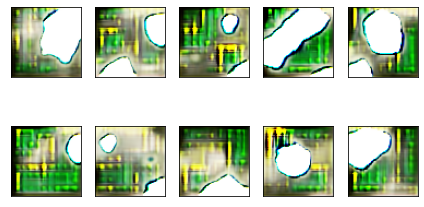

Epoch: 96,  Loss: D_real = 0.556, D_fake = 0.190,  G = 2.471
Currently on Epoch 97
	Currently on batch number 0 of 78
Epoch: 97,  Loss: D_real = 0.701, D_fake = 0.428,  G = 1.483
Currently on Epoch 98
	Currently on batch number 0 of 78
Epoch: 98,  Loss: D_real = 0.678, D_fake = 0.240,  G = 2.549
Currently on Epoch 99
	Currently on batch number 0 of 78
Epoch: 99,  Loss: D_real = 0.560, D_fake = 0.394,  G = 2.551
Currently on Epoch 100
	Currently on batch number 0 of 78
Epoch: 100,  Loss: D_real = 0.170, D_fake = 0.379,  G = 2.218
Training is complete


In [28]:
with tf.device('/gpu:0'):
 for epoch in range(epochs):
    print(f"Currently on Epoch {epoch+1}")
    
    # For every batch in the dataset
    for i in range(X_train.shape[0]//batch_size):
        
        if (i)%100 == 0:
            print(f"\tCurrently on batch number {i} of {len(X_train)//batch_size}")
            
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        
        gen_image = generator.predict_on_batch(noise)
        
        train_dataset = X_train[i*batch_size:(i+1)*batch_size]
        #train on real image
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = True
        d_loss1 = discriminator.train_on_batch(train_dataset,train_label)
        
        #train on fake image
        train_label=np.zeros(shape=(batch_size,1))
        d_loss2 = discriminator.train_on_batch(gen_image,train_label)
        
        
        noise=np.random.uniform(-1,1,size=[batch_size,noise_shape])
        train_label=np.ones(shape=(batch_size,1))
        discriminator.trainable = False
        #train the generator
        g_loss = GAN.train_on_batch(noise, train_label)
        D_loss.append(d_loss1+d_loss2)
        G_loss.append(g_loss)
        
         
    if epoch % 5 == 0:
        samples = 10
        x_fake = generator.predict(np.random.normal(loc=0, scale=1, size=(samples,100)))

        for k in range(samples):
            plt.subplot(2, 5, k+1)
            plt.imshow(x_fake[k])
            plt.xticks([])
            plt.yticks([])

        plt.tight_layout()
        plt.show()
    print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' %   (epoch+1, d_loss1, d_loss2, g_loss))        
print('Training is complete')

approx training time for 300 epochs was somthing little more than 2 hours.

# **Output Visualization**

In [29]:
noise=np.random.uniform(-1,1,size=[500,noise_shape])

In [30]:
im=generator.predict(noise)

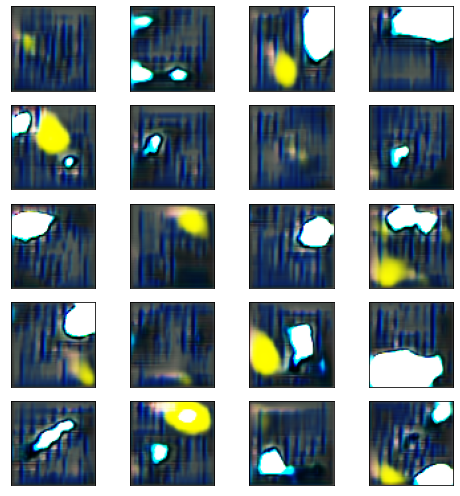

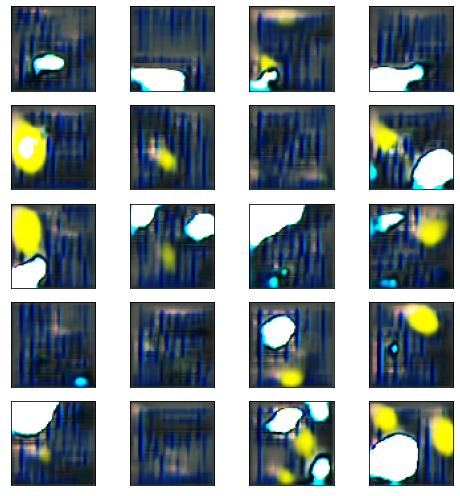

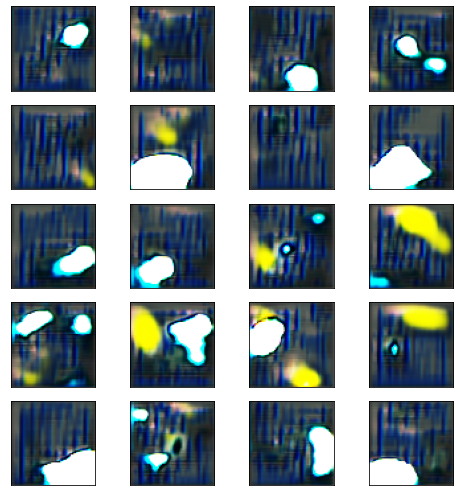

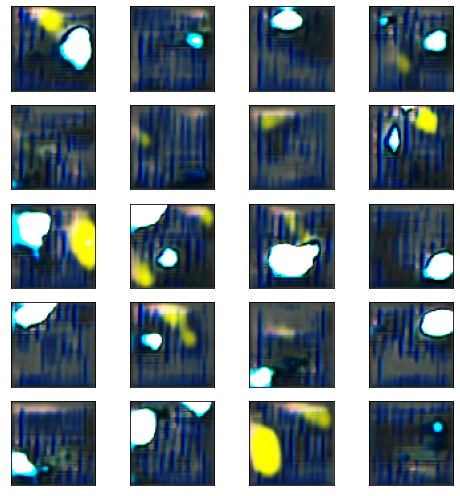

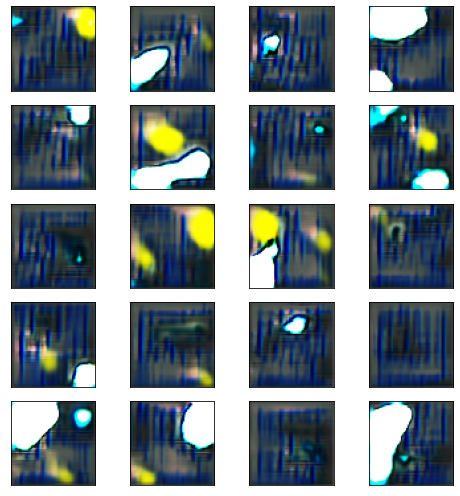

In [31]:
for i in range(5):
 plt.figure(figsize=(7,7))   
 for k in range(20):
            noise=np.random.uniform(-1,1,size=[100,noise_shape])
            im=generator.predict(noise) 
            plt.subplot(5, 4, k+1)
            plt.imshow(im[k])
            plt.xticks([])
            plt.yticks([])
 
 plt.tight_layout()
 plt.show()

# **Loss Curve**

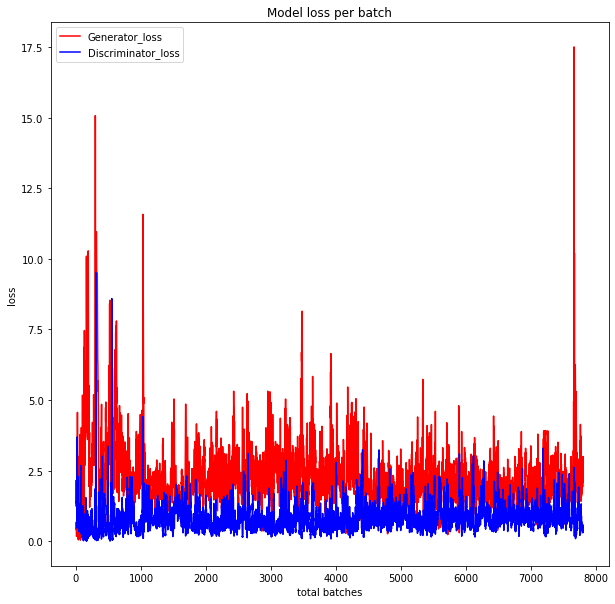

In [32]:
plt.figure(figsize=(10,10))
plt.plot(G_loss,color='red',label='Generator_loss')
plt.plot(D_loss,color='blue',label='Discriminator_loss')
plt.legend()
plt.xlabel('total batches')
plt.ylabel('loss')
plt.title('Model loss per batch')
plt.show()

# **Reference**

1. https://medium.com/coloredfeather/generating-human-faces-using-adversarial-network-960863bc1deb blog post
2. https://arxiv.org/abs/1511.06434  paper on DCGANS published in 2016


# **Comment if you have any queries or find anything wrong with the code**

# **Upvote if you like the kernel**

# **Thanks**